<a href="https://colab.research.google.com/github/tomraiz93/aespa/blob/main/Covid19%20Forecasting%20-%20ARIMA%20%2B%20Machine%20Learning.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# 1. Chuẩn bị dữ liệu

In [ ]:
import pandas as pd
import numpy as np
import seaborn as sns
import requests
from bs4 import BeautifulSoup
import matplotlib.pyplot as plt
import plotly.express as px

In [ ]:
# Truy cập URL của trang web COVID-19
url = "https://www.worldometers.info/coronavirus/"
response = requests.get(url)

# Kiểm tra mã trạng thái HTTP
if response.status_code == 200:
    # Phân tích cú pháp HTML
    soup = BeautifulSoup(response.text, "html.parser")

    # Tìm và lấy dữ liệu từ trang web
    # Ví dụ: lấy dữ liệu từ bảng có id là "main_table_countries_today"
    table = soup.find("table", {"id": "main_table_countries_today"})
    rows = table.find_all("tr")

    # Lấy tiêu đề cột từ hàng đầu tiên
    header_row = rows[0]
    headers = [header.text.strip() for header in header_row.find_all("th")]

    # Lấy dữ liệu từ các hàng còn lại
    data = []
    for row in rows[1:]:
        cells = row.find_all("td")
        row_data = [cell.text.strip() for cell in cells]
        data.append(row_data)

    # Tạo DataFrame từ dữ liệu
    df1 = pd.DataFrame(data, columns=headers)

    # Phân tích và xử lý DataFrame
    # Ví dụ: in 5 dòng đầu tiên của DataFrame
    print(df1.head())
else:
    print("Không thể truy cập trang web COVID-19")

  #  Country,Other   TotalCases NewCases TotalDeaths NewDeaths TotalRecovered  \
0    North America  129,363,822   +2,710   1,655,481        +9    125,085,762   
1             Asia  220,891,473     +538   1,551,859        +3    204,541,645   
2           Europe  251,304,849     +395   2,083,687        +3    246,965,543   
3    South America   69,304,718            1,363,029               66,575,735   
4          Oceania   14,627,153     +973      30,976        +5     14,482,287   

  NewRecovered ActiveCases Serious,Critical  ... TotalTests Tests/\n1M pop  \
0      +14,829   2,622,579            6,529  ...                             
1          +44  14,797,969           14,727  ...                             
2       +4,053   2,255,619            4,610  ...                             
3       +2,498   1,365,954            8,969  ...                             
4       +1,122     113,890               49  ...                             

  Population          Continent 1 Caseevery 

In [ ]:
import requests
import pandas as pd

# Gửi yêu cầu GET đến API của Worldometer để lấy dữ liệu COVID-19
url = "https://disease.sh/v3/covid-19/historical?lastdays=all"
response = requests.get(url)
data = response.json()

# Tạo một DataFrame để lưu trữ dữ liệu COVID-19
df = pd.DataFrame()

# Lặp qua từng quốc gia và lấy dữ liệu COVID-19
for country in data:
    country_name = country["country"]
    cases = country["timeline"]["cases"]
    deaths = country["timeline"]["deaths"]
    recovered = country["timeline"]["recovered"]

    # Chuyển đổi dữ liệu thành DataFrame và thêm vào df
    country_df = pd.DataFrame({"Date": pd.to_datetime(list(cases.keys())),
                               "Country": country_name,
                               "Cases": list(cases.values()),
                               "Deaths": list(deaths.values()),
                               "Recovered": list(recovered.values())})
    df = df.append(country_df)

# Lọc dữ liệu từ năm 2020 đến năm 2022 (hoặc đến bây giờ)
df["Date"] = pd.to_datetime(df["Date"])
start_date = pd.to_datetime("2020-01-01")
end_date = pd.to_datetime("2023-10-18")
filtered_df = df[(df["Date"] >= start_date) & (df["Date"] <= end_date)]

# Hiển thị dữ liệu
print(filtered_df)

<ipython-input-3-36a8d17488c1>:25: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(country_df)
<ipython-input-3-36a8d17488c1>:25: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(country_df)
<ipython-input-3-36a8d17488c1>:25: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(country_df)
<ipython-input-3-36a8d17488c1>:25: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(country_df)
<ipython-input-3-36a8d17488c1>:25: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(country_df)
<ipython-input-

           Date      Country   Cases  Deaths  Recovered
0    2020-01-22  Afghanistan       0       0          0
1    2020-01-23  Afghanistan       0       0          0
2    2020-01-24  Afghanistan       0       0          0
3    2020-01-25  Afghanistan       0       0          0
4    2020-01-26  Afghanistan       0       0          0
...         ...          ...     ...     ...        ...
1138 2023-03-05     Zimbabwe  264127    5668          0
1139 2023-03-06     Zimbabwe  264127    5668          0
1140 2023-03-07     Zimbabwe  264127    5668          0
1141 2023-03-08     Zimbabwe  264276    5671          0
1142 2023-03-09     Zimbabwe  264276    5671          0

[330327 rows x 5 columns]


<ipython-input-3-36a8d17488c1>:25: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(country_df)
<ipython-input-3-36a8d17488c1>:25: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(country_df)
<ipython-input-3-36a8d17488c1>:25: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(country_df)


In [ ]:
new_df = filtered_df
# Sắp xếp lại DataFrame theo thứ tự giảm dần của cột "Date"
new_df = new_df.sort_values(by='Date', ascending=True)

# Tính toán số ca mới nhiễm (New_Case)
new_df['New_Case'] = new_df.groupby('Country')['Cases'].diff().fillna(0)
new_df['New_Case'] = new_df['New_Case'].clip(lower=0)  # Đặt giá trị âm bằng 0

# Tính toán số ca mới tử vong (New_Death)
new_df['New_Death'] = new_df.groupby('Country')['Deaths'].diff().fillna(0)
new_df['New_Death'] = new_df['New_Death'].clip(lower=0)  # Đặt giá trị âm bằng 0

# Tính toán số ca mới hồi phục (New_Recovered)
new_df['New_Recovered'] = new_df.groupby('Country')['Recovered'].diff().fillna(0)
new_df['New_Recovered'] = new_df['New_Recovered'].clip(lower=0)  # Đặt giá trị âm bằng 0

# Hiển thị DataFrame với các thuộc tính mới
print(new_df)

           Date                           Country   Cases  Deaths  Recovered  \
0    2020-01-22                       Afghanistan       0       0          0   
0    2020-01-22                             Niger       0       0          0   
0    2020-01-22                             China       1       0          0   
0    2020-01-22                              Oman       0       0          0   
0    2020-01-22                             China       9       0          0   
...         ...                               ...     ...     ...        ...   
1142 2023-03-09                            Canada  153651    1890          0   
1142 2023-03-09                            France   78055     649          0   
1142 2023-03-09  Lao People's Democratic Republic  218023     758          0   
1142 2023-03-09                       New Zealand    7031       2          0   
1142 2023-03-09                          Zimbabwe  264276    5671          0   

      New_Case  New_Death  New_Recovere

In [ ]:
new_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 330327 entries, 0 to 1142
Data columns (total 8 columns):
 #   Column         Non-Null Count   Dtype         
---  ------         --------------   -----         
 0   Date           330327 non-null  datetime64[ns]
 1   Country        330327 non-null  object        
 2   Cases          330327 non-null  int64         
 3   Deaths         330327 non-null  int64         
 4   Recovered      330327 non-null  int64         
 5   New_Case       330327 non-null  float64       
 6   New_Death      330327 non-null  float64       
 7   New_Recovered  330327 non-null  float64       
dtypes: datetime64[ns](1), float64(3), int64(3), object(1)
memory usage: 22.7+ MB


In [ ]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 247 entries, 0 to 246
Data columns (total 22 columns):
 #   Column               Non-Null Count  Dtype 
---  ------               --------------  ----- 
 0   #                    247 non-null    object
 1   Country,Other        247 non-null    object
 2   TotalCases           247 non-null    object
 3   NewCases             247 non-null    object
 4   TotalDeaths          247 non-null    object
 5   NewDeaths            247 non-null    object
 6   TotalRecovered       247 non-null    object
 7   NewRecovered         247 non-null    object
 8   ActiveCases          247 non-null    object
 9   Serious,Critical     247 non-null    object
 10  Tot Cases/1M pop     247 non-null    object
 11  Deaths/1M pop        247 non-null    object
 12  TotalTests           247 non-null    object
 13  Tests/
1M pop        247 non-null    object
 14  Population           247 non-null    object
 15  Continent            247 non-null    object
 16  1 Caseev

In [ ]:
df1.rename(columns={'Country,Other': 'Country'}, inplace=True)
df1.head(10)

,#,Country,TotalCases,NewCases,TotalDeaths,NewDeaths,TotalRecovered,NewRecovered,ActiveCases,"Serious,Critical",...,TotalTests,Tests/\n1M pop,Population,Continent,1 Caseevery X ppl,1 Deathevery X ppl,1 Testevery X ppl,New Cases/1M pop,New Deaths/1M pop,Active Cases/1M pop
0,,North America,"129,363,822","+2,710","1,655,481",+9,"125,085,762","+14,829","2,622,579","6,529",...,,,,North America,,,,,,
1,,Asia,"220,891,473",+538,"1,551,859",+3,"204,541,645",+44,"14,797,969","14,727",...,,,,Asia,,,,,,
2,,Europe,"251,304,849",+395,"2,083,687",+3,"246,965,543","+4,053","2,255,619","4,610",...,,,,Europe,,,,,,
3,,South America,"69,304,718",,"1,363,029",,"66,575,735","+2,498","1,365,954","8,969",...,,,,South America,,,,,,
4,,Oceania,"14,627,153",+973,"30,976",+5,"14,482,287","+1,122","113,890",49,...,,,,Australia/Oceania,,,,,,
5,,Africa,"12,845,325",,"258,851",,"12,089,262",,"497,212",542,...,,,,Africa,,,,,,
6,,,721,,15,,706,,0,0,...,,,,,,,,,,
7,,World,"698,338,061","+4,616","6,943,898",+20,"669,740,940","+22,546","21,653,223","35,426",...,,,,All,,,,,,
8,1,USA,"109,518,696","+2,710","1,183,455",+9,"107,425,296","+13,476","909,945","1,374",...,"1,186,431,916","3,543,648","334,805,269",North America,3,283,0,8,0.03,"2,718"
9,2,India,"45,001,785",,"533,298",,N/A,N/A,N/A,N/A,...,"930,797,975","661,721","1,406,631,776",Asia,31,"2,638",2,,,0.2


# 2. Tiền xử lý dữ liệu

In [ ]:
# Xóa 8 hàng đầu và 8 hàng cuối để tạo DataFrame mới
new_df1 = df1.iloc[8:-8].reset_index(drop=True)

In [ ]:
merged_df = pd.merge(df1, new_df, on='Country')

In [ ]:
merged_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 310896 entries, 0 to 310895
Data columns (total 29 columns):
 #   Column               Non-Null Count   Dtype         
---  ------               --------------   -----         
 0   #                    310896 non-null  object        
 1   Country              310896 non-null  object        
 2   TotalCases           310896 non-null  object        
 3   NewCases             310896 non-null  object        
 4   TotalDeaths          310896 non-null  object        
 5   NewDeaths            310896 non-null  object        
 6   TotalRecovered       310896 non-null  object        
 7   NewRecovered         310896 non-null  object        
 8   ActiveCases          310896 non-null  object        
 9   Serious,Critical     310896 non-null  object        
 10  Tot Cases/1M pop     310896 non-null  object        
 11  Deaths/1M pop        310896 non-null  object        
 12  TotalTests           310896 non-null  object        
 13  Tests/
1M pop 

In [ ]:
variables = ['TotalCases', 'NewCases', 'TotalDeaths', 'NewDeaths', 'TotalRecovered', 'NewRecovered', 'ActiveCases','Population']

for var in variables:
    # Xóa các dấu phẩy trong chuỗi
    cleaned_string = merged_df[var].astype(str).str.replace(",", "")

    # Chuyển đổi chuỗi thành số nguyên
    merged_df[var] = pd.to_numeric(cleaned_string, errors='coerce').astype('float64')

In [ ]:
# Điền giá trị 0 vào các vị trí khuyết
merged_df['NewCases'] = merged_df['NewCases'].fillna(0)
merged_df['NewDeaths'] = merged_df['NewDeaths'].fillna(0)
merged_df['NewRecovered'] = merged_df['NewRecovered'].fillna(0)
merged_df['TotalDeaths'] = merged_df['TotalDeaths'].fillna(0)
merged_df['TotalRecovered'] = merged_df['TotalRecovered'].fillna(0)

In [ ]:
merged_df = merged_df.drop(['NewCases', 'NewDeaths', 'NewRecovered',
                            'Serious,Critical', 'Deaths/1M pop', 'TotalTests'
                            , 'Continent', '1 Caseevery X ppl', '1 Deathevery X ppl'
                            , '1 Testevery X ppl', 'New Cases/1M pop', 'New Deaths/1M pop'
                            , 'Active Cases/1M pop','Cases','Deaths','Recovered'], axis=1)

In [ ]:
merged_df.drop('#', axis=1, inplace=True)

In [ ]:
#Chuyển vị trí cột Date và cột TotalCases
merged_df = merged_df.reindex(columns=['TotalCases', 'Date'] + list(merged_df.columns.drop(['TotalCases', 'Date'])))

In [ ]:
merged_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 310896 entries, 0 to 310895
Data columns (total 12 columns):
 #   Column            Non-Null Count   Dtype         
---  ------            --------------   -----         
 0   TotalCases        310896 non-null  float64       
 1   Date              310896 non-null  datetime64[ns]
 2   Country           310896 non-null  object        
 3   TotalDeaths       310896 non-null  float64       
 4   TotalRecovered    310896 non-null  float64       
 5   ActiveCases       276606 non-null  float64       
 6   Tot Cases/1M pop  310896 non-null  object        
 7   Tests/
1M pop     310896 non-null  object        
 8   Population        308610 non-null  float64       
 9   New_Case          310896 non-null  float64       
 10  New_Death         310896 non-null  float64       
 11  New_Recovered     310896 non-null  float64       
dtypes: datetime64[ns](1), float64(8), object(3)
memory usage: 30.8+ MB


In [ ]:
# Sắp xếp lại DataFrame theo thứ tự giảm dần của cột "Date"
merged_df = merged_df.sort_values(by='Date', ascending=True)

# Đặt cột "Date" làm cột đầu tiên và đổi chỉ số cột
merged_df = merged_df.set_index('Date').reset_index()

In [ ]:
merged_df.isna().sum()

Date                    0
TotalCases              0
Country                 0
TotalDeaths             0
TotalRecovered          0
ActiveCases         34290
Tot Cases/1M pop        0
Tests/\n1M pop          0
Population           2286
New_Case                0
New_Death               0
New_Recovered           0
dtype: int64

In [ ]:
#Diển dữ liệu khuyết cho merged_df là 0
merged_df = merged_df.fillna(0)

In [ ]:
merged_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 310896 entries, 0 to 310895
Data columns (total 12 columns):
 #   Column            Non-Null Count   Dtype         
---  ------            --------------   -----         
 0   Date              310896 non-null  datetime64[ns]
 1   TotalCases        310896 non-null  float64       
 2   Country           310896 non-null  object        
 3   TotalDeaths       310896 non-null  float64       
 4   TotalRecovered    310896 non-null  float64       
 5   ActiveCases       310896 non-null  float64       
 6   Tot Cases/1M pop  310896 non-null  object        
 7   Tests/
1M pop     310896 non-null  object        
 8   Population        310896 non-null  float64       
 9   New_Case          310896 non-null  float64       
 10  New_Death         310896 non-null  float64       
 11  New_Recovered     310896 non-null  float64       
dtypes: datetime64[ns](1), float64(8), object(3)
memory usage: 28.5+ MB


In [ ]:
merged_df.head(10)

,Date,TotalCases,Country,TotalDeaths,TotalRecovered,ActiveCases,Tot Cases/1M pop,Tests/\n1M pop,Population,New_Case,New_Death,New_Recovered
0,2020-01-22,109518696.0,USA,1183455.0,107425296.0,909945.0,"327,112","3,543,648",334805269.0,0.0,0.0,0.0
1,2020-01-22,49046.0,Gabon,307.0,48674.0,65.0,"21,036","695,641",2331533.0,0.0,0.0,0.0
2,2020-01-22,48015.0,Andorra,165.0,0.0,0.0,"619,844","3,225,256",77463.0,0.0,0.0,0.0
3,2020-01-22,46864.0,Papua New Guinea,670.0,46168.0,26.0,"5,043","26,813",9292169.0,0.0,0.0,0.0
4,2020-01-22,38048773.0,Brazil,707470.0,36249161.0,1092142.0,"176,680","296,146",215353593.0,0.0,0.0,0.0
5,2020-01-22,43085.0,Tanzania,846.0,0.0,0.0,681,,63298550.0,0.0,0.0,0.0
6,2020-01-22,43025.0,Mauritius,1051.0,41278.0,696.0,"33,752","281,374",1274727.0,0.0,0.0,0.0
7,2020-01-22,39531.0,Togo,290.0,39216.0,25.0,"4,554","93,641",8680837.0,0.0,0.0,0.0
8,2020-01-22,38568.0,Guinea,468.0,37757.0,343.0,"2,782","47,607",13865691.0,0.0,0.0,0.0
9,2020-01-22,38084.0,Bahamas,844.0,36366.0,874.0,"95,087","643,767",400516.0,0.0,0.0,0.0


In [ ]:
merged_df['Country'].unique()

array(['USA', 'Gabon', 'Andorra', 'Papua New Guinea', 'Brazil',
       'Tanzania', 'Mauritius', 'Togo', 'Guinea', 'Bahamas', 'Germany',
       'Lesotho', 'Haiti', 'Mali', 'Saint Lucia', 'Seychelles', 'Benin',
       'Micronesia', 'Solomon Islands', 'Congo', 'San Marino',
       'Timor-Leste', 'Burkina Faso', 'Liechtenstein', 'Grenada',
       'South Sudan', 'Nicaragua', 'Tajikistan', 'Equatorial Guinea',
       'Monaco', 'Tonga', 'Somalia', 'Samoa', 'Burundi', 'S. Korea', 'UK',
       'Rwanda', 'Cameroon', 'Bhutan', 'Malta', 'Angola', 'Italy', 'DRC',
       'Malawi', 'Senegal', 'Suriname', 'Guyana', 'Belize', 'Japan',
       'Fiji', 'Madagascar', 'Cabo Verde', 'Sudan', 'Mauritania',
       'Barbados', 'Marshall Islands', 'Djibouti', 'China', 'France',
       'Dominica', 'Gambia', 'Vanuatu', 'Yemen', 'Eritrea', 'Niger',
       'Guinea-Bissau', 'Comoros', 'Antigua and Barbuda', 'Liberia',
       'Sierra Leone', 'Chad', 'Sao Tome and Principe',
       'Saint Kitts and Nevis', 'Palau', 'Na

In [ ]:
merged_df[merged_df['Country']=='Italy']

,Date,TotalCases,Country,TotalDeaths,TotalRecovered,ActiveCases,Tot Cases/1M pop,Tests/\n1M pop,Population,New_Case,New_Death,New_Recovered
52,2020-01-22,26363670.0,Italy,193144.0,25987972.0,182554.0,"437,479","4,567,139",60262770.0,0.0,0.0,0.0
447,2020-01-23,26363670.0,Italy,193144.0,25987972.0,182554.0,"437,479","4,567,139",60262770.0,0.0,0.0,0.0
674,2020-01-24,26363670.0,Italy,193144.0,25987972.0,182554.0,"437,479","4,567,139",60262770.0,0.0,0.0,0.0
917,2020-01-25,26363670.0,Italy,193144.0,25987972.0,182554.0,"437,479","4,567,139",60262770.0,0.0,0.0,0.0
1142,2020-01-26,26363670.0,Italy,193144.0,25987972.0,182554.0,"437,479","4,567,139",60262770.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...
309615,2023-03-05,26363670.0,Italy,193144.0,25987972.0,182554.0,"437,479","4,567,139",60262770.0,0.0,0.0,0.0
309876,2023-03-06,26363670.0,Italy,193144.0,25987972.0,182554.0,"437,479","4,567,139",60262770.0,0.0,0.0,0.0
310113,2023-03-07,26363670.0,Italy,193144.0,25987972.0,182554.0,"437,479","4,567,139",60262770.0,0.0,0.0,0.0
310548,2023-03-08,26363670.0,Italy,193144.0,25987972.0,182554.0,"437,479","4,567,139",60262770.0,0.0,0.0,0.0


In [ ]:
# Loại bỏ các dòng trùng lặp
merged_df = merged_df.drop_duplicates(subset=['Country', 'Date'])

In [ ]:
merged_df[merged_df['Country']=='Italy'].tail(10)

,Date,TotalCases,Country,TotalDeaths,TotalRecovered,ActiveCases,Tot Cases/1M pop,Tests/\n1M pop,Population,New_Case,New_Death,New_Recovered
308235,2023-02-28,26363670.0,Italy,193144.0,25987972.0,182554.0,"437,479","4,567,139",60262770.0,0.0,0.0,0.0
308529,2023-03-01,26363670.0,Italy,193144.0,25987972.0,182554.0,"437,479","4,567,139",60262770.0,0.0,0.0,0.0
308981,2023-03-02,26363670.0,Italy,193144.0,25987972.0,182554.0,"437,479","4,567,139",60262770.0,0.0,0.0,0.0
309216,2023-03-03,26363670.0,Italy,193144.0,25987972.0,182554.0,"437,479","4,567,139",60262770.0,26658.0,228.0,0.0
309514,2023-03-04,26363670.0,Italy,193144.0,25987972.0,182554.0,"437,479","4,567,139",60262770.0,0.0,0.0,0.0
309615,2023-03-05,26363670.0,Italy,193144.0,25987972.0,182554.0,"437,479","4,567,139",60262770.0,0.0,0.0,0.0
309876,2023-03-06,26363670.0,Italy,193144.0,25987972.0,182554.0,"437,479","4,567,139",60262770.0,0.0,0.0,0.0
310113,2023-03-07,26363670.0,Italy,193144.0,25987972.0,182554.0,"437,479","4,567,139",60262770.0,0.0,0.0,0.0
310548,2023-03-08,26363670.0,Italy,193144.0,25987972.0,182554.0,"437,479","4,567,139",60262770.0,0.0,0.0,0.0
310725,2023-03-09,26363670.0,Italy,193144.0,25987972.0,182554.0,"437,479","4,567,139",60262770.0,0.0,0.0,0.0


# 3. Trực quan hóa dữ liệu

In [ ]:
# Biểu đồ heatmap tương quan của merged_df
fig = px.imshow(merged_df.corr())
fig.update_layout(width=800, height=800)
fig.show()

<ipython-input-26-5f0aa22f1167>:2: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  fig = px.imshow(merged_df.corr())


In [ ]:
import plotly.express as px

# Lọc dữ liệu cho Ý
italy_df = merged_df[merged_df['Country'] == 'Italy']

# Vẽ biểu đồ động cho Ý
fig_italy = px.line(italy_df, x='Date', y='New_Case', title='Số lượng ca mới tại Ý')
fig_italy.update_layout(width=800, height=400)  # Sửa kích thước của biểu đồ
fig_italy.show()

In [ ]:
# Lọc dữ liệu cho Mỹ
us_df = merged_df[merged_df['Country'] == 'USA']

# Vẽ biểu đồ động cho Mỹ
fig_us = px.line(us_df, x='Date', y='New_Case', title='Số lượng ca mới tại Mỹ')
fig_us.update_layout(width=800, height=400)  # Sửa kích thước của biểu đồ
fig_us.show()

In [ ]:
# Lọc dữ liệu cho Việt Nam
germany_df = merged_df[merged_df['Country'] == 'Germany']

# Vẽ biểu đồ động cho Việt Nam
fig_germany = px.line(germany_df, x='Date', y='New_Case', title='Số lượng ca mới tại Đức')
fig_germany.update_layout(width=800, height=400)  # Sửa kích thước của biểu đồ
fig_germany.show()

# Lọc dữ liệu cho Nhật Bản
japan_df = merged_df[merged_df['Country'] == 'Japan']

# Vẽ biểu đồ động cho Nhật Bản
fig_japan = px.line(japan_df, x='Date', y='New_Case', title='Số lượng ca mới tại Nhật Bản')
fig_japan.update_layout(width=800, height=400)  # Sửa kích thước của biểu đồ
fig_japan.show()


# Lọc dữ liệu cho Việt Nam
vietnam_df = merged_df[merged_df['Country'] == 'Vietnam']

# Vẽ biểu đồ động cho Việt Nam
fig_vietnam = px.line(vietnam_df, x='Date', y='New_Case', title='Số lượng ca mới tại Việt Nam')
fig_vietnam.update_layout(width=800, height=400)  # Sửa kích thước của biểu đồ
fig_vietnam.show()

In [ ]:
import plotly.graph_objects as go
# Tạo biểu đồ đa dạng
fig = go.Figure()

# Thêm dữ liệu cho các quốc gia
fig.add_trace(go.Scatter(x=italy_df['Date'], y=italy_df['New_Case'], name='Italy'))
fig.add_trace(go.Scatter(x=us_df['Date'], y=us_df['New_Case'], name='USA'))
fig.add_trace(go.Scatter(x=germany_df['Date'], y=germany_df['New_Case'], name='Germany'))
fig.add_trace(go.Scatter(x=japan_df['Date'], y=japan_df['New_Case'], name='Japan'))
fig.add_trace(go.Scatter(x=vietnam_df['Date'], y=vietnam_df['New_Case'], name='Vietnam'))

# Cấu hình biểu đồ
fig.update_layout(
    title='Số lượng ca mới của các quốc gia',
    xaxis_title='Ngày',
    yaxis_title='Số lượng ca mới',
    width=800,
    height=400
)

# Hiển thị biểu đồ
fig.show()

In [ ]:
# Tính tổng số ca nhiễm cho mỗi quốc gia
country_totals = merged_df.groupby('Country')['TotalCases'].sum().reset_index()

# Sắp xếp theo tổng số ca nhiễm giảm dần
top_10_countries = country_totals.nlargest(10, 'TotalCases')

# Tính tổng số ca nhiễm của các quốc gia khác
other_cases = country_totals['TotalCases'].sum() - top_10_countries['TotalCases'].sum()

# Tạo danh sách tên quốc gia để hiển thị trên biểu đồ
country_names = list(top_10_countries['Country']) + ['Các quốc gia khác']
case_counts = list(top_10_countries['TotalCases']) + [other_cases]

# Tạo biểu đồ tròn
fig = go.Figure(data=go.Pie(labels=country_names, values=case_counts))

# Cấu hình biểu đồ
fig.update_layout(title='Số ca nhiễm theo quốc gia', width=800, height=600)

# Hiển thị biểu đồ
fig.show()

In [ ]:
import plotly.express as px

# Tạo biểu đồ bản đồ thế giới với màu sắc được xác định bởi tổng số ca nhiễm
fig = px.scatter_geo(merged_df, locations='Country', locationmode='country names',
                     color='TotalCases', hover_name='Country', size='TotalCases',
                     projection='natural earth')

fig.update_layout(title='World Map of Total COVID-19 Cases',
                  coloraxis_colorbar=dict(title='Total Cases'))

fig.show()

# 4. Xây dựng và huấn luyện mô hình

#  **K-means**

In [ ]:
from sklearn.cluster import KMeans
import pandas as pd
from sklearn.cluster import KMeans

# Chọn các đặc trưng để phân cụm
features = ['TotalCases', 'TotalDeaths','TotalRecovered','ActiveCases','New_Case', 'New_Death', 'New_Recovered']
X = merged_df[features]

# Sử dụng thuật toán K-means để phân cụm
num_clusters = 3  # Số lượng cụm mong muốn
kmeans = KMeans(n_clusters=num_clusters)
kmeans.fit(X)

# Thêm cột Cluster vào DataFrame gốc
merged_df['Cluster'] = kmeans.labels_+1

# In ra số lượng mẫu trong mỗi cụm
print(merged_df['Cluster'].value_counts())

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



1    198882
2     10287
3      1143
Name: Cluster, dtype: int64


In [ ]:
# Tìm tâm cụm
cluster_centers = kmeans.cluster_centers_

# In tâm cụm
print("\nTâm cụm:")
for i, center in enumerate(cluster_centers):
    print(f"Cụm {i+1}: {center}")


Tâm cụm:
Cụm 1: [1.56226147e+06 1.81190115e+04 1.27198695e+06 1.77698333e+04
 8.65165521e+03 4.63013847e+01 4.15724208e+02]
Cụm 2: [3.38483486e+07 2.80318444e+05 2.46888047e+07 1.90629333e+05
 2.21421008e+05 2.37259697e+03 7.07940303e+03]
Cụm 3: [1.09518696e+08 1.18345500e+06 1.07425296e+08 9.09945000e+05
 9.08193902e+04 9.83717410e+02 5.51506124e+03]


In [ ]:
merged_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 210312 entries, 0 to 310894
Data columns (total 13 columns):
 #   Column            Non-Null Count   Dtype         
---  ------            --------------   -----         
 0   Date              210312 non-null  datetime64[ns]
 1   TotalCases        210312 non-null  float64       
 2   Country           210312 non-null  object        
 3   TotalDeaths       210312 non-null  float64       
 4   TotalRecovered    210312 non-null  float64       
 5   ActiveCases       210312 non-null  float64       
 6   Tot Cases/1M pop  210312 non-null  object        
 7   Tests/
1M pop     210312 non-null  object        
 8   Population        210312 non-null  float64       
 9   New_Case          210312 non-null  float64       
 10  New_Death         210312 non-null  float64       
 11  New_Recovered     210312 non-null  float64       
 12  Cluster           210312 non-null  int32         
dtypes: datetime64[ns](1), float64(8), int32(1), object(3)
memor

In [ ]:
new_data = merged_df[['Date','Country', 'New_Case',  'TotalCases', 'Cluster']]

In [ ]:
new_data[new_data['Cluster'] == 3]

,Date,Country,New_Case,TotalCases,Cluster
0,2020-01-22,USA,0.0,109518696.0,3
425,2020-01-23,USA,0.0,109518696.0,3
771,2020-01-24,USA,1.0,109518696.0,3
1057,2020-01-25,USA,0.0,109518696.0,3
1269,2020-01-26,USA,3.0,109518696.0,3
...,...,...,...,...,...
309590,2023-03-05,USA,0.0,109518696.0,3
310051,2023-03-06,USA,8564.0,109518696.0,3
310108,2023-03-07,USA,35371.0,109518696.0,3
310388,2023-03-08,USA,64861.0,109518696.0,3


In [ ]:
# In ra các quốc gia thuộc cụm 3
cluster_3_countries = merged_df[merged_df['Cluster'] == 3]['Country'].unique()
print(cluster_3_countries)

['USA']


In [ ]:
cluster_2_countries = merged_df[merged_df['Cluster'] == 2]['Country'].unique()
print(cluster_2_countries)

['Brazil' 'Germany' 'S. Korea' 'UK' 'Italy' 'Japan' 'France' 'Russia'
 'India']


In [ ]:
cluster_1_countries = merged_df[merged_df['Cluster'] == 1]['Country'].unique()
print(cluster_1_countries)
print(len(cluster_1_countries))

['Gabon' 'Andorra' 'Papua New Guinea' 'Tanzania' 'Mauritius' 'Togo'
 'Guinea' 'Bahamas' 'Lesotho' 'Haiti' 'Mali' 'Saint Lucia' 'Seychelles'
 'Benin' 'Micronesia' 'Solomon Islands' 'Congo' 'San Marino' 'Timor-Leste'
 'Burkina Faso' 'Liechtenstein' 'Grenada' 'South Sudan' 'Nicaragua'
 'Tajikistan' 'Equatorial Guinea' 'Monaco' 'Tonga' 'Somalia' 'Samoa'
 'Burundi' 'Rwanda' 'Cameroon' 'Bhutan' 'Malta' 'Angola' 'DRC' 'Malawi'
 'Senegal' 'Suriname' 'Guyana' 'Belize' 'Fiji' 'Madagascar' 'Cabo Verde'
 'Sudan' 'Mauritania' 'Barbados' 'Marshall Islands' 'Djibouti' 'China'
 'Dominica' 'Gambia' 'Vanuatu' 'Yemen' 'Eritrea' 'Niger' 'Guinea-Bissau'
 'Comoros' 'Antigua and Barbuda' 'Liberia' 'Sierra Leone' 'Chad'
 'Sao Tome and Principe' 'Saint Kitts and Nevis' 'Palau' 'Nauru' 'Tuvalu'
 'Diamond Princess' 'MS Zaandam' 'Kiribati' 'Cambodia' 'Canada'
 'Australia' 'Spain' 'Turkey' 'Thailand' 'Czechia' 'Peru' 'Switzerland'
 'Philippines' 'South Africa' 'Romania' 'Denmark' 'Sweden' 'Singapore'
 'Serbia' 'Ne

In [ ]:
new_data[new_data['Cluster'] == 1]['Country'].unique().size

174

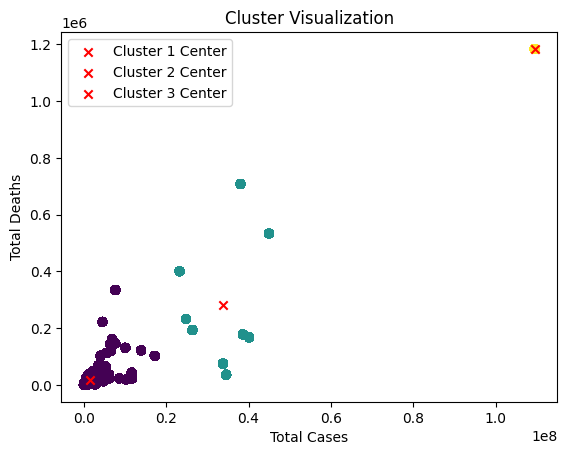

In [ ]:
import matplotlib.pyplot as plt

# Tạo một biểu đồ scatter plot với các cụm được màu sắc khác nhau
plt.scatter(X['TotalCases'], X['TotalDeaths'], c=merged_df['Cluster'], cmap='viridis')
plt.xlabel('Total Cases')
plt.ylabel('Total Deaths')
plt.title('Cluster Visualization')

# Vẽ tâm cụm
for i, center in enumerate(cluster_centers):
    plt.scatter(center[0], center[1], c='red', marker='x', label=f'Cluster {i+1} Center')

plt.legend()
plt.show()

In [ ]:
'''
from sklearn.metrics import silhouette_score

# Đánh giá hiệu suất của mô hình K-means
silhouette_avg = silhouette_score(X, kmeans.labels_)
print("Silhouette score:", silhouette_avg)
'''

'\nfrom sklearn.metrics import silhouette_score\n\n# Đánh giá hiệu suất của mô hình K-means\nsilhouette_avg = silhouette_score(X, kmeans.labels_)\nprint("Silhouette score:", silhouette_avg)\n'

# Hồi quy Logistic

# Phân loại số ca nhiễm Covid tại Việt Nam

In [ ]:
vietnam_df.head()

,Date,TotalCases,Country,TotalDeaths,TotalRecovered,ActiveCases,Tot Cases/1M pop,Tests/\n1M pop,Population,New_Case,New_Death,New_Recovered
271,2020-01-22,11624114.0,Vietnam,43206.0,10640971.0,939937.0,"117,470","867,342",98953541.0,0.0,0.0,0.0
354,2020-01-23,11624114.0,Vietnam,43206.0,10640971.0,939937.0,"117,470","867,342",98953541.0,2.0,0.0,0.0
733,2020-01-24,11624114.0,Vietnam,43206.0,10640971.0,939937.0,"117,470","867,342",98953541.0,0.0,0.0,0.0
1019,2020-01-25,11624114.0,Vietnam,43206.0,10640971.0,939937.0,"117,470","867,342",98953541.0,0.0,0.0,0.0
1170,2020-01-26,11624114.0,Vietnam,43206.0,10640971.0,939937.0,"117,470","867,342",98953541.0,0.0,0.0,0.0


In [ ]:
from sklearn.preprocessing import LabelEncoder

# Tạo một đối tượng LabelEncoder
label_encoder = LabelEncoder()

# Mã hóa biến "Country" thành các số nguyên
merged_df['Countryid'] = label_encoder.fit_transform(merged_df['Country'])

In [ ]:
#Hiển thị ra cột Countryid và Country
unique_values = merged_df[['Countryid', 'Country']].drop_duplicates()
unique_values

,Countryid,Country
0,173,USA
1,58,Gabon
2,3,Andorra
3,126,Papua New Guinea
4,22,Brazil
...,...,...
267,12,Bahrain
268,155,Sri Lanka
269,168,Tunisia
270,73,India


In [ ]:
from imblearn.over_sampling import SMOTE
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, classification_report

# Xác định biến đầu vào và biến đầu ra
X = merged_df[['TotalCases', 'TotalDeaths', 'TotalRecovered', 'New_Case', 'New_Death', 'New_Recovered', 'Population', 'ActiveCases']]
y = merged_df['Countryid']

# Chia dữ liệu thành tập huấn luyện và tập kiểm tra
X_train, X_test, y_train, y_test = train_test_split(X, y==170, test_size=0.2, random_state=42)

In [ ]:
# Xây dựng và huấn luyện mô hình Logistic Regression
model = LogisticRegression()
#model.fit(X_train_resampled, y_train_resampled)
model.fit(X_train, y_train)
# Dự đoán giá trị cho tập kiểm tra
y_pred = model.predict(X_test)

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



In [ ]:
from sklearn.metrics import accuracy_score, classification_report
# Đánh giá hiệu suất của mô hình
accuracy = accuracy_score(y_test, y_pred)
classification_report = classification_report(y_test, y_pred)

print("Accuracy:", accuracy)
print("Classification Report:")
print(classification_report)

Accuracy: 0.999976226136985
Classification Report:
              precision    recall  f1-score   support

       False       1.00      1.00      1.00     41830
        True       1.00      1.00      1.00       233

    accuracy                           1.00     42063
   macro avg       1.00      1.00      1.00     42063
weighted avg       1.00      1.00      1.00     42063



In [ ]:
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(y_test, y_pred)
cm

array([[41830,     0],
       [    1,   232]])

In [ ]:
TP = 41830
FP = 0
FN = 0
TN = 233

accuracy = (TP + TN) / (TP + TN + FP + FN)
accuracy

1.0

In [ ]:
precision = TP / (TP + FP)
precision

1.0

In [ ]:
recall = TP / (TP + FN)
recall

1.0

In [ ]:
f1_score = 2 * (precision * recall) / (precision + recall)
f1_score

1.0

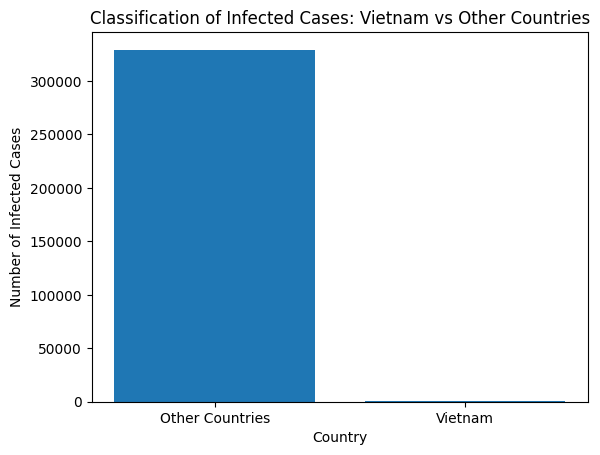

In [ ]:
import matplotlib.pyplot as plt

# Count the number of instances in each class
class_counts = merged_df['Country'].value_counts()

# Select the count for the 'Vietnam' class
vietnam_count = class_counts['Vietnam']

# Create a bar plot
plt.bar(['Other Countries', 'Vietnam'], [len(new_df) - vietnam_count, vietnam_count])
plt.xlabel('Country')
plt.ylabel('Number of Infected Cases')
plt.title('Classification of Infected Cases: Vietnam vs Other Countries')
plt.show()

# Dự đoán số ca nhiễm trong tương lai tại Việt Nam

# ARIMA Model

In [ ]:
vietnam_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1143 entries, 271 to 310758
Data columns (total 12 columns):
 #   Column            Non-Null Count  Dtype         
---  ------            --------------  -----         
 0   Date              1143 non-null   datetime64[ns]
 1   TotalCases        1143 non-null   float64       
 2   Country           1143 non-null   object        
 3   TotalDeaths       1143 non-null   float64       
 4   TotalRecovered    1143 non-null   float64       
 5   ActiveCases       1143 non-null   float64       
 6   Tot Cases/1M pop  1143 non-null   object        
 7   Tests/
1M pop     1143 non-null   object        
 8   Population        1143 non-null   float64       
 9   New_Case          1143 non-null   float64       
 10  New_Death         1143 non-null   float64       
 11  New_Recovered     1143 non-null   float64       
dtypes: datetime64[ns](1), float64(8), object(3)
memory usage: 116.1+ KB


In [ ]:
vietnam_df['New_Case'] = vietnam_df['New_Case'].astype(int)

<ipython-input-57-bf87b1f7575a>:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [ ]:
pip install pmdarima

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.1/2.1 MB 9.9 MB/s eta 0:00:00


In [ ]:
import pandas as pd
from statsmodels.tsa.arima.model import ARIMA
from pmdarima import auto_arima

# Tạo chuỗi thời gian từ dữ liệu New_Case
time_series = pd.Series(vietnam_df['New_Case'])

# Sử dụng auto_arima để tìm kiếm mô hình ARIMA tốt nhất
model = auto_arima(time_series, start_p=1, start_q=1, max_p=3, max_q=3, seasonal=False, trace=True)

# Hiển thị thông số tốt nhất của mô hình
print(model.summary())

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=25806.018, Time=0.30 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=26512.861, Time=0.07 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=25947.565, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=25884.721, Time=0.33 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=26510.861, Time=0.05 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=25806.384, Time=0.48 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=25807.341, Time=0.41 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=25815.912, Time=0.23 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=25812.114, Time=0.15 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=25799.135, Time=0.59 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=25797.308, Time=1.35 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=25800.257, Time=0.52 sec
 ARIMA(3,1,3)(0,0,0)[0] intercept   : AIC=25775.319, Time=1.24 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=25776.946, Time=1.95 sec
 ARIMA(3,1,3)(0,0,0

In [ ]:
from statsmodels.tsa.arima.model import ARIMA

# Xây dựng mô hình ARIMA với các tham số đã cho
model = ARIMA(time_series, order=(3, 1, 3))

# Giai đoạn khớp mô hình với dữ liệu
model_fit = model.fit()


forecast = model_fit.predict(n_periods=270)

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

An unsupported index was provided and will be ignored when e.g. forecasting.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

An unsupported index was provided and will be ignored when e.g. forecasting.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

An unsupported index was provided and will be ignored when e.g. forecasting.



In [ ]:
from datetime import datetime
start_date = datetime(2023, 3, 1).date()
forecast_index = pd.date_range(start=start_date, periods=len(forecast), freq='D')

# Tạo DataFrame với các cột 'Date' và 'Forecast'
forecast_df = pd.DataFrame({'Date': forecast_index, 'Forecast': forecast})

#Làm tròn số giá trị forecast_df
forecast_df['Forecast'] = forecast_df['Forecast'].round()

# Giới hạn DataFrame chỉ chứa dữ liệu trong khoảng thời gian mong muốn
forecast_df = forecast_df[(forecast_df['Date'] >= datetime(2023, 3, 1)) & (forecast_df['Date'] <= datetime(2024, 1, 1))]

# Đặt các giá trị âm bằng 0 và loại bỏ dấu "-"
forecast_df['Forecast'] = forecast_df['Forecast'].apply(lambda x: abs(x))

# In ra bảng kết quả dự đoán
print(forecast_df.to_string(index=False))

      Date  Forecast
2023-03-01       0.0
2023-03-02       0.0
2023-03-03       0.0
2023-03-04       1.0
2023-03-05       1.0
2023-03-06       0.0
2023-03-07       0.0
2023-03-08       0.0
2023-03-09       0.0
2023-03-10       0.0
2023-03-11       0.0
2023-03-12       1.0
2023-03-13       2.0
2023-03-14       1.0
2023-03-15       1.0
2023-03-16       1.0
2023-03-17       1.0
2023-03-18       1.0
2023-03-19       1.0
2023-03-20       1.0
2023-03-21       1.0
2023-03-22       1.0
2023-03-23       1.0
2023-03-24       1.0
2023-03-25       1.0
2023-03-26       0.0
2023-03-27       0.0
2023-03-28       0.0
2023-03-29       0.0
2023-03-30       0.0
2023-03-31       0.0
2023-04-01       0.0
2023-04-02       0.0
2023-04-03       0.0
2023-04-04       0.0
2023-04-05       0.0
2023-04-06       0.0
2023-04-07       0.0
2023-04-08       0.0
2023-04-09       0.0
2023-04-10       0.0
2023-04-11       0.0
2023-04-12       0.0
2023-04-13       0.0
2023-04-14       0.0
2023-04-15       0.0
2023-04-16   

In [ ]:
# Vẽ biểu đồ ARIMA bằng Plotly
fig = go.Figure()
fig.add_trace(go.Scatter(x=forecast_df['Date'], y=forecast_df['Forecast'], mode='lines', name='ARIMA Forecast'))
fig.update_layout(title='ARIMA Forecast', xaxis_title='Date', yaxis_title='Forecast')
fig.show()

In [ ]:
# Tạo biểu đồ tổng hợp
fig = go.Figure()

# Thêm dữ liệu thực tế
fig.add_trace(go.Scatter(x=vietnam_df['Date'], y=vietnam_df['New_Case'], mode='lines', name='Actual'))

# Thêm dữ liệu dự đoán
fig.add_trace(go.Scatter(x=forecast_df['Date'], y=forecast_df['Forecast'], mode='lines', name='Forecast'))

fig.update_layout(title='Actual vs Forecast', xaxis_title='Date', yaxis_title='Value')
fig.show()

In [ ]:
# Create a trace for the forecasted values as a table
forecast_table_trace = go.Table(
    header=dict(values=['Date', 'Forecast']),
    cells=dict(values=[forecast_df['Date'], forecast_df['Forecast']])
)

# Create the layout
layout = go.Layout(
    title='ARIMA Forecast',
    xaxis=dict(title='Date'),
    yaxis=dict(title='New Cases')
)

# Create the figure and add the traces
fig = go.Figure(data=[go.Scatter(x=vietnam_df['Date'], y=vietnam_df['New_Case'], mode='lines', name='Actual'),
                      go.Scatter(x=forecast_df['Date'], y=forecast_df['Forecast'], mode='lines', name='Forecast'),
                      forecast_table_trace],
                layout=layout)

# Show the figure
fig.show()

In [ ]:
import plotly.graph_objects as go

# Lọc dữ liệu để loại bỏ các ca nhiễm từ 31/10/2023 trở về trước
filtered_forecast_df = forecast_df[forecast_df['Date'] > '2023-10-31']

# Create a trace for the forecasted values as a table
forecast_table_trace = go.Table(
    header=dict(values=['Date', 'Forecast']),
    cells=dict(values=[filtered_forecast_df['Date'], filtered_forecast_df['Forecast']])
)

# Create the layout
layout = go.Layout(
    title='ARIMA Forecast',
    xaxis=dict(title='Date'),
    yaxis=dict(title='New Cases')
)

# Create the figure and add the traces
fig = go.Figure(data=[go.Scatter(x=vietnam_df['Date'], y=vietnam_df['New_Case'], mode='lines', name='Actual'),
                      go.Scatter(x=forecast_df['Date'], y=forecast_df['Forecast'], mode='lines', name='Forecast'),
                      forecast_table_trace],
                layout=layout)

# Show the figure
fig.show()